In [ ]:
from google.colab import files
_ = files.upload()

In [ ]:
import warnings
warnings.simplefilter('ignore')

When using the 'inline' backend, matplotlib graphs will be included in the notebook, next to the code.

In [ ]:
%matplotlib inline

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

Plots look more readable in svg.

In [ ]:
%config InlineBackend.figure_format = 'svg'

Increase the default plots' size.

In [ ]:
from pylab import rcParams
rcParams['figure.figsize'] = 8, 5

In [ ]:
import pandas as pd

Read data.

In [ ]:
df = pd.read_csv('video_games_sales.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16717 non-null  object 
 1   Platform         16719 non-null  object 
 2   Year_of_Release  16450 non-null  float64
 3   Genre            16717 non-null  object 
 4   Publisher        16665 non-null  object 
 5   NA_Sales         16719 non-null  float64
 6   EU_Sales         16719 non-null  float64
 7   JP_Sales         16719 non-null  float64
 8   Other_Sales      16719 non-null  float64
 9   Global_Sales     16719 non-null  float64
 10  Critic_Score     8137 non-null   float64
 11  Critic_Count     8137 non-null   float64
 12  User_Score       10015 non-null  object 
 13  User_Count       7590 non-null   float64
 14  Developer        10096 non-null  object 
 15  Rating           9950 non-null   object 
dtypes: float64(9), object(7)
memory usage: 2.0+ MB


In [ ]:
df['User_Score'] = df.User_Score.astype('float64', errors='ignore')
df['Year_of_Release'] = df.Year_of_Release.astype('int64', errors='ignore')
df['User_Count'] = df.User_Count.astype('int64', errors='ignore')
df['Critic_Count'] = df.Critic_Count.astype('int64', errors='ignore')

Drop rows where data is not full.

In [ ]:
df = df.dropna()
print(df.shape)

(6825, 16)


In [ ]:
useful_cols = ['Name', 'Platform', 'Year_of_Release', 'Genre', 'Global_Sales', 
               'Critic_Score', 'Critic_Count', 'User_Score', 'User_Count', 
               'Rating']
df[useful_cols].head()

,Name,Platform,Year_of_Release,Genre,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Rating
0,Wii Sports,Wii,2006,Sports,82.53,76.0,51,8.0,322,E
2,Mario Kart Wii,Wii,2008,Racing,35.52,82.0,73,8.3,709,E
3,Wii Sports Resort,Wii,2009,Sports,32.77,80.0,73,8.0,192,E
6,New Super Mario Bros.,DS,2006,Platform,29.80,89.0,65,8.5,431,E
7,Wii Play,Wii,2006,Misc,28.92,58.0,41,6.6,129,E


Build the plot of video games sales in different countries depending on the year. First, filter the columns, then calculate total sales by year and finally call the *plot()* function.

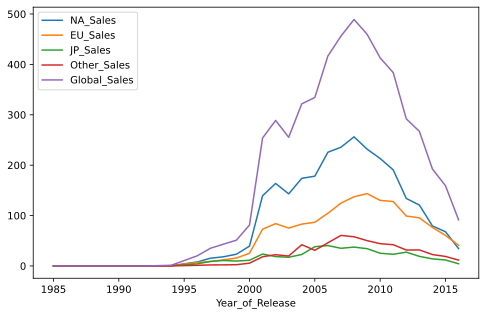

In [ ]:
sales_df = df[[x for x in df.columns if 'Sales' in x] + ['Year_of_Release']]
sales_df.groupby('Year_of_Release').sum().plot()

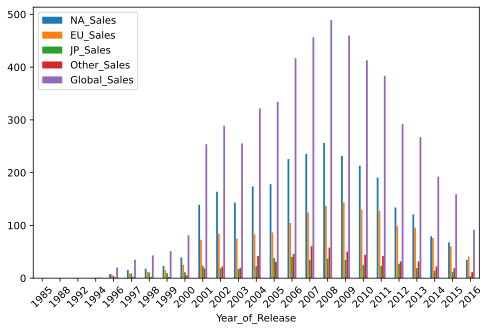

In [ ]:
sales_df.groupby('Year_of_Release').sum().plot(kind='bar', rot=45)

In [ ]:
cols = ['Global_Sales', 'Critic_Score', 'Critic_Count', 'User_Score', 
        'User_Count']
sns_plot = sns.pairplot(df[cols])
sns_plot.savefig('pairplot.png')